## Convert Datasets into TFRecod data type
* https://towardsdatascience.com/working-with-tfrecords-and-tf-train-example-36d111b3ff4d
* http://digital-thinking.de/tensorflow-vs-keras-or-how-to-speed-up-your-training-for-image-data-sets-by-factor-10/

### Create a list of image paths

In [1]:
import glob
import numpy as np
import tensorflow as tf

In [2]:
# be sure to be in the exact working directory
%pwd
%cd DL-transferLearning-handsON/

[WinError 2] The system cannot find the file specified: 'DL-transferLearning-handsON/'
C:\Users\alsha\Desktop\DL-transferLearning-handsON


In [3]:
melanoma = 'melanoma//'
image_paths_melanoma = glob.glob(melanoma + '*.jpg')


In [4]:
nevus = 'nevus//'
image_paths_nevus = glob.glob(nevus + '*.jpg')


In [5]:
seborrheic = 'seborrheic_keratosis//'
image_paths_seborrheic = glob.glob(seborrheic + '*.jpg')


In [6]:
len(image_paths_melanoma)

117

In [7]:
len(image_paths_nevus)

393

In [8]:
len(image_paths_seborrheic)

90

In [9]:
type(image_paths_seborrheic)

list

In [10]:
image_paths_seborrheic

['seborrheic_keratosis\\ISIC_0012086.jpg',
 'seborrheic_keratosis\\ISIC_0012134.jpg',
 'seborrheic_keratosis\\ISIC_0012136.jpg',
 'seborrheic_keratosis\\ISIC_0012178.jpg',
 'seborrheic_keratosis\\ISIC_0012199.jpg',
 'seborrheic_keratosis\\ISIC_0012207.jpg',
 'seborrheic_keratosis\\ISIC_0012215.jpg',
 'seborrheic_keratosis\\ISIC_0012223.jpg',
 'seborrheic_keratosis\\ISIC_0012240.jpg',
 'seborrheic_keratosis\\ISIC_0012248.jpg',
 'seborrheic_keratosis\\ISIC_0012265.jpg',
 'seborrheic_keratosis\\ISIC_0012266.jpg',
 'seborrheic_keratosis\\ISIC_0012272.jpg',
 'seborrheic_keratosis\\ISIC_0012273.jpg',
 'seborrheic_keratosis\\ISIC_0012314.jpg',
 'seborrheic_keratosis\\ISIC_0012323.jpg',
 'seborrheic_keratosis\\ISIC_0012330.jpg',
 'seborrheic_keratosis\\ISIC_0012358.jpg',
 'seborrheic_keratosis\\ISIC_0012364.jpg',
 'seborrheic_keratosis\\ISIC_0012372.jpg',
 'seborrheic_keratosis\\ISIC_0012375.jpg',
 'seborrheic_keratosis\\ISIC_0012387.jpg',
 'seborrheic_keratosis\\ISIC_0012388.jpg',
 'seborrhei

In [11]:
paths = [image_paths_melanoma,image_paths_nevus,image_paths_seborrheic]
image_paths = [ j for i in paths for j in i]


In [12]:
data = [i.split('\\')[1] for i in image_paths ]

In [13]:
data

['ISIC_0012258.jpg',
 'ISIC_0012356.jpg',
 'ISIC_0012369.jpg',
 'ISIC_0012395.jpg',
 'ISIC_0012425.jpg',
 'ISIC_0012758.jpg',
 'ISIC_0012989.jpg',
 'ISIC_0013072.jpg',
 'ISIC_0013073.jpg',
 'ISIC_0013242.jpg',
 'ISIC_0013277.jpg',
 'ISIC_0013321.jpg',
 'ISIC_0013374.jpg',
 'ISIC_0013411.jpg',
 'ISIC_0013414.jpg',
 'ISIC_0013455.jpg',
 'ISIC_0013457.jpg',
 'ISIC_0013459.jpg',
 'ISIC_0013472.jpg',
 'ISIC_0013473.jpg',
 'ISIC_0013565.jpg',
 'ISIC_0013577.jpg',
 'ISIC_0013588.jpg',
 'ISIC_0013615.jpg',
 'ISIC_0013617.jpg',
 'ISIC_0013636.jpg',
 'ISIC_0013678.jpg',
 'ISIC_0013696.jpg',
 'ISIC_0013733.jpg',
 'ISIC_0013739.jpg',
 'ISIC_0013766.jpg',
 'ISIC_0013767.jpg',
 'ISIC_0013813.jpg',
 'ISIC_0013814.jpg',
 'ISIC_0013833.jpg',
 'ISIC_0013842.jpg',
 'ISIC_0013867.jpg',
 'ISIC_0013908.jpg',
 'ISIC_0013917.jpg',
 'ISIC_0013925.jpg',
 'ISIC_0013948.jpg',
 'ISIC_0013953.jpg',
 'ISIC_0013987.jpg',
 'ISIC_0013988.jpg',
 'ISIC_0014027.jpg',
 'ISIC_0014059.jpg',
 'ISIC_0014077.jpg',
 'ISIC_001410

In [14]:
len(image_paths)

600

In [15]:
try:
    assert 600 == len(image_paths_melanoma) + len(image_paths_nevus) + len(image_paths_seborrheic)
    print('same length')
except:
    print('the lengths are not equals')

same length


In [16]:
393+90

483

In [17]:
393+117

510

In [18]:
117+483

600

### Create labels

In [19]:
labels = np.append(np.zeros(117, dtype=int),np.ones(483, dtype=int))


In [20]:
labels[510:] = 2

In [21]:
labels

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [22]:
np.unique(labels,return_counts=True)

(array([0, 1, 2]), array([117, 393,  90], dtype=int64))

In [23]:
data_dict = dict(zip(data,labels))

In [24]:
data_dict

{'ISIC_0012258.jpg': 0,
 'ISIC_0012356.jpg': 0,
 'ISIC_0012369.jpg': 0,
 'ISIC_0012395.jpg': 0,
 'ISIC_0012425.jpg': 0,
 'ISIC_0012758.jpg': 0,
 'ISIC_0012989.jpg': 0,
 'ISIC_0013072.jpg': 0,
 'ISIC_0013073.jpg': 0,
 'ISIC_0013242.jpg': 0,
 'ISIC_0013277.jpg': 0,
 'ISIC_0013321.jpg': 0,
 'ISIC_0013374.jpg': 0,
 'ISIC_0013411.jpg': 0,
 'ISIC_0013414.jpg': 0,
 'ISIC_0013455.jpg': 0,
 'ISIC_0013457.jpg': 0,
 'ISIC_0013459.jpg': 0,
 'ISIC_0013472.jpg': 0,
 'ISIC_0013473.jpg': 0,
 'ISIC_0013565.jpg': 0,
 'ISIC_0013577.jpg': 0,
 'ISIC_0013588.jpg': 0,
 'ISIC_0013615.jpg': 0,
 'ISIC_0013617.jpg': 0,
 'ISIC_0013636.jpg': 0,
 'ISIC_0013678.jpg': 0,
 'ISIC_0013696.jpg': 0,
 'ISIC_0013733.jpg': 0,
 'ISIC_0013739.jpg': 0,
 'ISIC_0013766.jpg': 0,
 'ISIC_0013767.jpg': 0,
 'ISIC_0013813.jpg': 0,
 'ISIC_0013814.jpg': 0,
 'ISIC_0013833.jpg': 0,
 'ISIC_0013842.jpg': 0,
 'ISIC_0013867.jpg': 0,
 'ISIC_0013908.jpg': 0,
 'ISIC_0013917.jpg': 0,
 'ISIC_0013925.jpg': 0,
 'ISIC_0013948.jpg': 0,
 'ISIC_0013953.j

### Display some images

In [25]:
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
%matplotlib inline

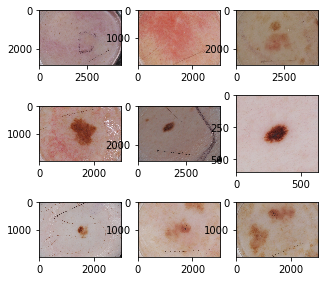

In [26]:
plt.figure(figsize =(5,5))
for i,path in enumerate(image_paths_melanoma[0:9]):
    img = image.load_img(path)
    plt.subplot(3,3,i+1)
    plt.imshow(img)

### TFRecord functions 
* https://www.tensorflow.org/tutorials/load_data/tfrecord

### Functions to convert each feature type

In [27]:
def _bytes_feature(value):
    if isinstance(value, type(tf.constant(0))):
        value = value.numpy() # BytesList won't unpack a string from an EagerTensor.
        return tf.train.Feature(bytes_list=tf.train.BytesList(value=[value]))

def _float_feature(value):
    return tf.train.Feature(float_list=tf.train.FloatList(value=[value]))

def _int64_feature(value):
    return tf.train.Feature(int64_list=tf.train.Int64List(value=[value]))


In [28]:
import tensorflow as tf

### Images contain 5 fearure types:
* img name : byte type
* img hight : int type
* img width : int type
* img channel : int type
* label : int type

### Combin all convert it features
### Create a Features message using tf.train.Example. ( one training example)


In [29]:
def serialize_example(image, label):
    feature = {
        'image': _bytes_feature(image), # filepath only not the image content
        'label': _int64_feature(label),
    }
    example_proto = tf.train.Example(features=tf.train.Features(feature=feature))
    return example_proto.SerializeToString()


###  Create TFrecord file

##### this code create bigger size of images cuz convert data to array then byte
* https://stackoverflow.com/questions/51292318/tfrecords-occupy-more-space-than-original-jpeg-images

In [34]:
%pwd

'C:\\Users\\alsha\\Desktop\\DL-transferLearning-handsON'

In [38]:
tfrecord_dir = 'data_without_dim.tfrecords'
with tf.io.TFRecordWriter(tfrecord_dir) as writer:
    for image_path, label in data_dict.items():
        tf_example = serialize_example(tf.io.serialize_tensor(image_path), label)
        writer.write(tf_example)

### Load TFRecord file

In [39]:
raw_image_dataset = tf.data.TFRecordDataset(tfrecord_dir)


In [44]:
def read_tfrecord(serialized_example):
    feature_description = {
        'image': tf.io.FixedLenFeature((), tf.string),
        'label': tf.io.FixedLenFeature((), tf.int64),

        
  }
    example = tf.io.parse_single_example(serialized_example, feature_description)
    
    label = example['label']
    image = tf.io.parse_tensor(example['image'], out_type = tf.string)  
    return image, label


In [45]:
parsed_dataset = raw_image_dataset.map(read_tfrecord)
for data in parsed_dataset.take(2):
    print(data)


(<tf.Tensor: id=1860, shape=(), dtype=string, numpy=b'ISIC_0012258.jpg'>, <tf.Tensor: id=1861, shape=(), dtype=int64, numpy=0>)
(<tf.Tensor: id=1862, shape=(), dtype=string, numpy=b'ISIC_0012356.jpg'>, <tf.Tensor: id=1863, shape=(), dtype=int64, numpy=0>)


In [50]:
for image, label in parsed_dataset.take(1):
    image = image.numpy().decode('utf-8') 
    label = label.numpy() 


In [51]:
label

0

In [54]:
%pwd

'C:\\Users\\alsha\\Desktop\\DL-transferLearning-handsON'

In [64]:
%cd melanoma

C:\Users\alsha\Desktop\DL-transferLearning-handsON\melanoma


In [65]:
image_pic = tf.keras.preprocessing.image.load_img(image)

https://stackoverflow.com/questions/49643907/clipping-input-data-to-the-valid-range-for-imshow-with-rgb-data-0-1-for-floa

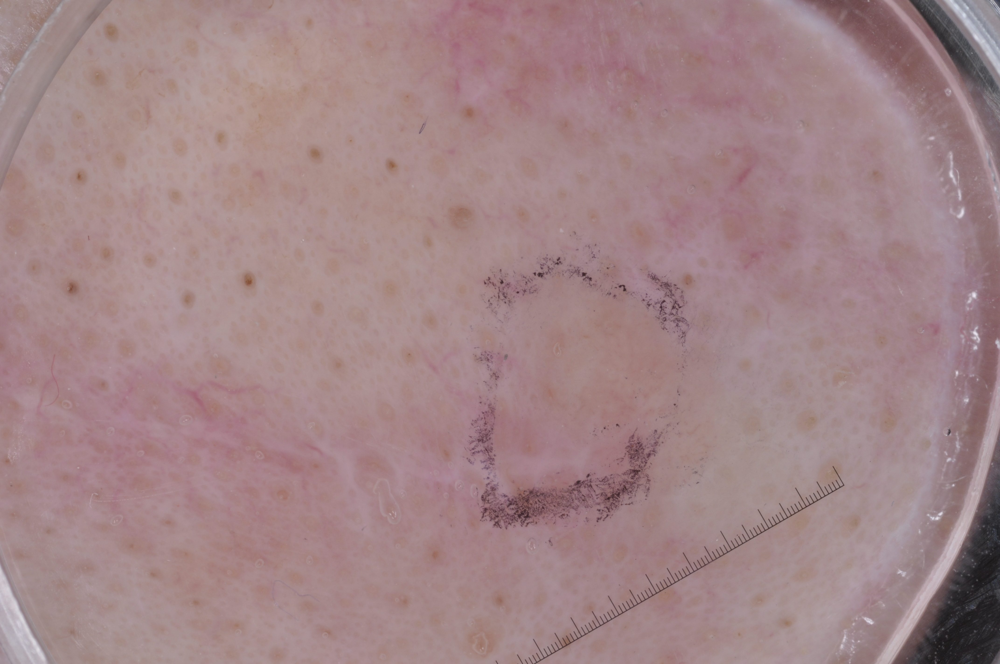

In [68]:
image_pic